# Backtesting System  
Teh Chern  


This is a personal project of running a backtesting system using the multiple technical indicators to evaluate the Tech Giants in the U.S. stock market. 

### **Assumptions:**   
• Initial capital: USD 100,000         
• Backtesting date range: 2000-01-01 to 2024-12-31   
• Indicators: RSI 14 30 70, MA 50 200     
• Stocks to compare with NASDAQ: AAPL, MSFT, NVDA, META, GOOG, AVGO, TSM, AMD  
### **Trading Strategies:** 
1. **'RSI'** : Buy when RSI < 30, Sell when RSI > 70  
2. **'MA'** : Buy when Golden Cross, Sell when Death Cross  
3. **'RSI, MA'** : Buy when RSI < 30 and 50MA > 200MA, Sell when RSI > 70 and 50MA < 200MA

## Table of Contents
1. [Backtesting Code](#1)  
2. [Run Backtest](#2)
3. [Performance Metrics](#3)
4. [Comparing Portfolio with NASDAQ](#4)
5. [Plot Portfolio Performance vs NASDAQ](#5)
6. [Plot Stock Price with Trading Signals](#6)


<a id="1"></a>
### 1. Backtesting Code

In [1]:
import yfinance as yf
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import timedelta, datetime
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import os

class Backtester:
    def __init__(self, start_date='2000-01-01', end_date='2024-12-31', initial_capital=100000, commission=0.001, slippage=0.0002,
                 min_shares=1, risk_free_rate=0.02, strategy = 'RSI, MA', rsi_buy=30, rsi_sell=70, trading_days = 252):
        self.strategy = strategy
        self.start_date = start_date
        self.end_date = end_date
        self.initial_capital = initial_capital
        self.commission = commission
        self.slippage = slippage
        self.min_shares = min_shares
        self.risk_free_rate = risk_free_rate
        self.rsi_buy = rsi_buy
        self.rsi_sell = rsi_sell
        self.trading_days = trading_days

        # Establishing stocks with their IPO dates
        self.stocks = {
            'AAPL': {'ipo': '1980-12-12'},
            'MSFT': {'ipo': '1986-03-13'},
            'NVDA': {'ipo': '1999-01-22'},
            'META': {'ipo': '2012-05-18'},
            'GOOG': {'ipo': '2004-08-19'},
            'AVGO': {'ipo': '2009-08-06'},
            'TSM': {'ipo': '1997-10-08'},
            'AMD': {'ipo': '1972-09-27'}
        }
        self.data = {}
        self.portfolio = {}
        self.signals = {}
        self.performance = {}

    def fetch_data(self):
        print("\nFetching historical data...")
        # Create data directory
        os.makedirs('magnificent7_data', exist_ok=True)
        for quote, info in self.stocks.items():
            try:
                ticker = yf.Ticker(quote)
                data = ticker.history(
                    start=self.start_date, end=self.end_date, auto_adjust=True)
                data.index = data.index.tz_localize(None)

                if not data.empty:
                    # Only include necessary columns of 'Open', 'High', 'Low', 'Close', 'Volume'
                    data = data[['Open', 'High', 'Low', 'Close', 'Volume']]
                    data['Open'] = data['Open']
                    data['Close'] = data['Close']
                    data['Returns'] = data['Close'].pct_change()
                    self.data[quote] = data

                else:
                    print(f"{quote}: No data available")

            except Exception as e:
                print(f"Error fetching data for {quote}: {e}")
        print("Fetching completed.")

    def calculate_rsi(self, prices, period=14):
        delta = prices.diff()
        gain = (delta.where(delta > 0, 0)).rolling(window=period).mean()
        loss = (-delta.where(delta < 0, 0)).rolling(window=period).mean()
        rs = gain / loss
        rsi = 100 - (100 / (1 + rs))
        return rsi
    
    def calculate_moving_averages(self, data):
        data['MA_50'] = data['Close'].rolling(window=50).mean()
        data['MA_200'] = data['Close'].rolling(window=200).mean()
        data['EMA_20'] = data['Close'].ewm(span=20, adjust=False).mean()
        return data

    def generate_signals(self):
        print("\nGenerating trading signals...")
        print(f"Strategy: {self.strategy}")
        if 'RSI' in self.strategy:
            print(f"Period (Days): 14  Buy Signal: RSI < {self.rsi_buy}  Sell Signal: RSI > {self.rsi_sell}:")
        
        for quote, data in self.data.items():
            
            # Generate signals
            data['RSI'] = None
            data['MA_50'] = None
            data['MA_200'] = None
            data['Signal'] = 0    
            data['RSI Signal'] = 0
           
            if self.strategy == 'RSI':
                data['RSI'] = self.calculate_rsi(data['Close'])
                buy_condition = data['RSI'] < self.rsi_buy
                sell_condition = data['RSI'] > self.rsi_sell
                
                data.loc[buy_condition, 'Signal'] = 1
                data.loc[sell_condition, 'Signal'] = -1
                
            elif self.strategy == 'MA':
                # Golden Cross (signals uptrend): 50 MA crosses above 200 MA
                # Death Cross (signals downtrend): 50 MA crosses below 200 MA
                data = self.calculate_moving_averages(data)
                data['MA_Cross'] = np.where(data['MA_50'] > data['MA_200'], 1, -1)
                data['MA_Cross_Previous'] = data['MA_Cross'].shift(1)

                # Buy when Golden Cross (crossover happens from -1 to 1)
                buy_condition = (data['MA_Cross'] == 1) & (data['MA_Cross_Previous'] == -1)
                # Sell when Death Cross (crossover happens from -1 to 1)
                sell_condition = (data['MA_Cross'] == -1) & (data['MA_Cross_Previous'] == 1)
                
                data.loc[buy_condition, 'Signal'] = 1
                data.loc[sell_condition, 'Signal'] = -1

            elif self.strategy == 'RSI, MA':
                # Combine RSI and Golden Cross/Death Cross
                data['RSI'] = self.calculate_rsi(data['Close'])
                data['RSI Signal'] = np.where(data['RSI'] < self.rsi_buy, 1, data['RSI Signal'])
                data['RSI Signal'] = np.where(data['RSI'] > self.rsi_sell, -1, data['RSI Signal'])

                data = self.calculate_moving_averages(data)
                data['MA_Cross'] = np.where(data['MA_50'] > data['MA_200'], 1, -1)
                
                buy_condition = (data['MA_Cross'] == 1) & (data['RSI'] < self.rsi_buy)
                sell_condition = (data['MA_Cross'] == -1) & (data['RSI'] > self.rsi_sell)
                
                data.loc[buy_condition, 'Signal'] = 1
                data.loc[sell_condition, 'Signal'] = -1

            # Signal executed at next day's open
            data['Position'] = data['Signal'].shift(1).fillna(0)

            self.signals[quote] = data[['RSI', 'Signal', 'Position']]
            print(f"{quote}: {len(data[data['Signal'] != 0])} signals generated")

            # Save data with signals to CSV
            signals_filename = f"magnificent7_data/{quote}_with_signals.csv"
            data.to_csv(signals_filename)

    def backtest(self):
        print("\nRunning backtest...")
        print(f"Date Range: {self.start_date} to {self.end_date}")
        # Use NASDAQ trading day data for indexing
        nasdaq = yf.Ticker("^IXIC")
        nasdaq_data = nasdaq.history(start= self.start_date, end=self.end_date, auto_adjust=True)
        nasdaq_data.index = nasdaq_data.index.tz_localize(None)
        all_dates = nasdaq_data.index

        portfolio_df = pd.DataFrame(index=all_dates)

        # Align all stock data to the trading dates
        aligned_data = {}
        for quote, data in self.data.items():
            # Reindex and forward fill missing values
            aligned_data[quote] = data.reindex(all_dates, method='ffill')

        # Initialize all columns at once to avoid fragmentation
        portfolio_df['Total_Value'] = float(self.initial_capital)
        portfolio_df['Daily_Return'] = 0.0
        portfolio_df['Cash_Reserve'] = float(self.initial_capital)
        portfolio_df['Target_Stock_Value'] = float(self.initial_capital)/len(self.stocks)

        # Initialize all stock-related columns at once
        for quote in self.stocks.keys():
            portfolio_df[f'{quote}_Buy'] = 0
            portfolio_df[f'{quote}_Sell'] = 0
            portfolio_df[f'{quote}_Shares'] = 0
            portfolio_df[f'{quote}_Value'] = 0.0

        # Start trading process
        trades = []
        for i in range(1, len(portfolio_df)):
            # Initialise current_date and previous_date to use for later
            current_date = portfolio_df.index[i]
            previous_date = portfolio_df.index[i-1]

            portfolio_df.loc[current_date,'Cash_Reserve'] = portfolio_df.loc[previous_date, 'Cash_Reserve']
            cash_reserve = portfolio_df.loc[current_date, 'Cash_Reserve']

            # Initialise current date columns from previous values
            for quote in self.stocks.keys():
                portfolio_df.loc[current_date, f'{quote}_Buy'] = 0
                portfolio_df.loc[current_date, f'{quote}_Sell'] = 0
                portfolio_df.loc[current_date,
                                 f'{quote}_Shares'] = portfolio_df.loc[previous_date, f'{quote}_Shares']

            # Calculate current information values for all stocks
            current_values = {}
            total_account_value = cash_reserve

            for quote in self.stocks.keys():
                current_price = aligned_data[quote].loc[current_date, 'Open']
                if pd.isna(current_price):
                    # Skip if there's no price data and initialise with zero value
                    current_values[quote] = {'price': 0,
                                             'shares': portfolio_df.loc[current_date, f'{quote}_Shares'],
                                             'stock_value': 0
                                             }
                    continue

                current_shares = portfolio_df.loc[current_date,f'{quote}_Shares']
                stock_value = current_shares * current_price
                current_values[quote] = {'price': current_price,
                                         'shares': current_shares,
                                         'stock_value': stock_value
                                         }
                total_account_value += stock_value

            # Target Value Per Stock after rebalancing
            portfolio_df.loc[current_date,'Target_Stock_Value'] = total_account_value / len(self.stocks)

            # Storing all signals for the day
            buy_signals = []
            sell_signals = []
            for quote in self.stocks.keys():
                signal = aligned_data[quote].loc[current_date, 'Position']
                if pd.notna(signal):
                    if signal == 1:
                        buy_signals.append(quote)
                    elif signal == -1:
                        sell_signals.append(quote)

            # Process Sell Signals
            if sell_signals:
                for quote in sell_signals:
                    # Check if quote exists in current_values with has valid data
                    if quote not in current_values or current_values[quote]['price'] == 0:
                        continue

                    values = current_values[quote]
                    current_price = values['price']
                    current_shares = values['shares']

                    # Only sell if we have enough shares (>= 10 shares)
                    if current_shares >= self.min_shares:
                        # Execute Sell and update portfolio
                        trade_value = current_shares * current_price
                        sell_cost = trade_value * \
                            (1 - self.commission - self.slippage)
                        cash_reserve += sell_cost
                        portfolio_df.loc[current_date,
                                         f'{quote}_Sell'] = current_shares
                        portfolio_df.loc[current_date, f'{quote}_Shares'] = 0
                        current_values[quote]['shares'] = 0
                        current_values[quote]['stock_value'] = 0

                        # Record trade
                        trades.append({
                            'Date': current_date,
                            'Quote': quote,
                            'Action': 'Sell',
                            'Shares': current_shares,
                            'Price': current_price,
                            'Value': trade_value,
                            'Commission': trade_value * self.commission,
                            'Slippage': trade_value * self.slippage
                        })

                        # Rebalance after Sell
                        total_account_value = cash_reserve
                        for stock_quote in self.stocks.keys():
                            if stock_quote in current_values:
                                total_account_value += current_values[stock_quote]['stock_value']

                        # Update target stock value
                        portfolio_df.loc[current_date,
                                         'Target_Stock_Value'] = total_account_value / len(self.stocks)

            # Process Buy Signals
            if buy_signals:
                for quote in buy_signals:
                    # Check if quote exists in current_values with valid data
                    if quote not in current_values or current_values[quote]['price'] == 0:
                        continue

                    values = current_values[quote]
                    current_price = values['price']
                    current_shares = values['shares']
                    stock_value = values['stock_value']

                    # Value Needed to reach Target Stock Value
                    value_needed = portfolio_df.loc[current_date,
                                                    'Target_Stock_Value'] - stock_value

                    # Proceed if Value Needed is more than minimum trade
                    if value_needed >= current_price * self.min_shares:
                        if cash_reserve >= value_needed:  # Proceed if have enough cash to execute buy
                            shares_to_buy = int(
                                value_needed // (current_price * (1 + self.commission + self.slippage)))
                            if shares_to_buy >= self.min_shares:
                                # Execute Buy and update portfolio
                                trade_value = shares_to_buy * current_price
                                buy_cost = trade_value * \
                                    (1 + self.commission + self.slippage)
                                cash_reserve -= buy_cost
                                portfolio_df.loc[current_date,
                                                 f'{quote}_Buy'] = shares_to_buy
                                new_shares = current_shares + shares_to_buy
                                portfolio_df.loc[current_date,
                                                 f'{quote}_Shares'] = new_shares
                                current_values[quote]['shares'] = new_shares
                                current_values[quote]['stock_value'] = new_shares * \
                                    current_price

                                # Record trade
                                trades.append({
                                    'Date': current_date,
                                    'Quote': quote,
                                    'Action': 'Buy',
                                    'Shares': shares_to_buy,
                                    'Price': current_price,
                                    'Value': trade_value,
                                    'Commission': trade_value * self.commission,
                                    'Slippage': trade_value * self.slippage
                                })

                                # Rebalance after Buy
                                total_account_value = cash_reserve
                                for stock_quote in self.stocks.keys():
                                    if stock_quote in current_values:
                                        total_account_value += current_values[stock_quote]['stock_value']

                                # Update target stock value
                                portfolio_df.loc[current_date, 'Target_Stock_Value'] = total_account_value / len(
                                    self.stocks)

            # Update Cash Reserve
            portfolio_df.loc[current_date, 'Cash_Reserve'] = cash_reserve

            # Update 'Total Value' and Stock Values in portfolio_df using close prices
            total_value = cash_reserve
            for quote in self.stocks.keys():
                if current_date in aligned_data[quote].index:
                    close_price = aligned_data[quote].loc[current_date, 'Close']
                    if pd.notna(close_price):
                        shares = portfolio_df.loc[current_date,
                                                  f'{quote}_Shares']
                        stock_value = shares * close_price
                        total_value += stock_value
                        # Update stock value with close price
                        portfolio_df.loc[current_date,
                                         f'{quote}_Value'] = stock_value
                    else:
                        # Stock doesn't exist yet or no close price
                        portfolio_df.loc[current_date, f'{quote}_Value'] = 0
                else:
                    portfolio_df.loc[current_date, f'{quote}_Value'] = 0

            # Update 'Total Value'
            portfolio_df.loc[current_date, 'Total_Value'] = total_value

            # Calculate Daily Return
            if portfolio_df.loc[previous_date, 'Total_Value'] > 0:
                portfolio_df.loc[current_date, 'Daily_Return'] = (
                    portfolio_df.loc[current_date, 'Total_Value'] /
                    portfolio_df.loc[previous_date, 'Total_Value'] - 1
                )

        # Store results
        self.portfolio_df = portfolio_df.copy()  # Use copy to defragment
        self.trades_df = pd.DataFrame(trades) if trades else pd.DataFrame()

        portfolio_df.to_csv('magnificent7_data/portfolio.csv')
        self.trades_df.to_csv('magnificent7_data/trades.csv')

        print(f"Backtest completed. Total trades: {len(trades)}")

    def calc_performance_metrics(self):
        # Remove unnecessary rows
        portfolio_total_values = self.portfolio_df['Total_Value'].dropna()
        daily_returns = self.portfolio_df['Daily_Return'].dropna()

        # 1. Total Return
        initial_value = self.initial_capital
        final_value = portfolio_total_values.iloc[-1]
        total_return = (final_value / initial_value - 1) * 100

        # 2. Annual Return
        start_date = pd.to_datetime(self.start_date)
        end_date = pd.to_datetime(self.end_date)
        years = (end_date - start_date).days / 365.25
        annual_return = (((final_value/initial_value)**(1/years)) - 1)*100
        
        # 3. Annual Volatility
        daily_volatility = daily_returns.std()
        annual_volatility = daily_volatility * np.sqrt(self.trading_days) * 100
        # 5. Sharpe Ratio

        sharpe_ratio = ((annual_return) - self.risk_free_rate*100)/annual_volatility

        # 3. Total Trades
        # Calculate information of trades
        if not self.trades_df.empty:
            total_trades = len(self.trades_df)
            buy_trades = self.trades_df[self.trades_df['Action'] == 'Buy']
            sell_trades = self.trades_df[self.trades_df['Action'] == 'Sell']

            # Average Return per Trade (approximate)
            if len(sell_trades) > 0:
                # Match buy and sell trades to calculate returns
                trade_returns = []
                sorted_sells = sell_trades.sort_values('Date').copy()

                # Shift 1 row down for Date to get the previous date
                sorted_sells['prev_sell_date'] = sorted_sells.groupby('Quote')[
                    'Date'].shift(1)

                # Now you can easily access the previous sell date
                for _, sell in sorted_sells.iterrows():
                    quote = sell['Quote']
                    sell_price = sell['Price']
                    sell_date = sell['Date']
                    previous_sell_date = sell['prev_sell_date']

                    if pd.isna(previous_sell_date):
                        # No previous sell - get all buys from beginning
                        previous_sell_date = pd.Timestamp.min
                    else:
                        # Use the actual previous sell date
                        previous_sell_date = previous_sell_date

                    # Find all buys between previous_sell_date and current sell_date
                    relevant_buys = buy_trades[
                        (buy_trades['Quote'] == quote) &
                        (buy_trades['Date'] > previous_sell_date) &
                        (buy_trades['Date'] < sell_date)
                    ]

                    if not relevant_buys.empty:
                        # Calculate weighted average buy price across all relevant buys
                        total_shares = relevant_buys['Shares'].sum()
                        total_cost = (
                            relevant_buys['Shares'] * relevant_buys['Price']).sum()
                        average_buy_price = total_cost / total_shares

                        trade_return = (
                            sell_price / average_buy_price - 1) * 100
                        trade_returns.append(trade_return)

                if trade_returns:
                    average_return_per_trade = np.mean(trade_returns)

                    # 4. Win Rate
                    winning_trades = [x for x in trade_returns if x > 0]
                    win_rate = (len(winning_trades) / len(trade_returns)) * 100

                else:
                    print("\n8. Unable to calculate - No matching buy and sell pairs")
            else:
                print("\n8. Unable to calculate - No sell trades executed")
        else:
            print("\\n8. Unable to calculate - No trades executed")

        self.performance = {'Total Return (%)': total_return,
                            'Initial Portfolio Value': initial_value,
                            'Final Portfolio Value': final_value,
                            'Annual Return (%)': annual_return,
                            'Annual Volatility (%)': annual_volatility,
                            'Sharpe Ratio': sharpe_ratio,
                            'Total Trades': total_trades,
                            'Buy Trades': buy_trades,
                            'Sell Trades': sell_trades,
                            'Win Rate (%)': win_rate,
                            'Winning Trades': len(winning_trades),
                            'Losing Trades': len(trade_returns) - len(winning_trades),
                            'Total Completed Trades': len(trade_returns),
                            'Average Trade Return': average_return_per_trade
                            }

    def display_performance_metrics(self):
        self.calc_performance_metrics()
        print("\nPerformance Metrics:")
        print(f"\n1. Total Gain (%): {self.performance['Total Return (%)']:.2f}%\n   (Initial Capital: ${self.performance['Initial Portfolio Value']:,.2f}, Final Capital: ${self.performance['Final Portfolio Value']:,.2f}, Gain: ${self.performance['Final Portfolio Value'] - self.performance['Initial Portfolio Value']:,.2f})")
        print(f"\n2. CAGR: {self.performance['Annual Return (%)']:.2f}%")
        #print(f"\n3. Annual Volatility: {self.performance['Annual Volatility (%)']:.2f}%")
        #print(f"\n4. Sharpe Ratio: {self.performance['Sharpe Ratio']:.2f}")
        print(f"\n3. Total Trades: {self.performance['Total Trades']}\n   (Buy Trades: {len(self.performance['Buy Trades'])}, Sell Trades: {len(self.performance['Sell Trades'])}) (Average Trade Return: {self.performance['Average Trade Return']:.2f}%)")
        print(f"\n4. Win Rate: {self.performance['Win Rate (%)']:.2f}%\n   (Winning Trades: {self.performance['Winning Trades']}, Losing Trades: {self.performance['Losing Trades']}, Total Completed Trades: {self.performance['Total Completed Trades']})\n")

   
    def nasdaq_comparison(self):
        print("\nNASDAQ Comparison:\n")

        # Download NASDAQ index data
        try:
            nasdaq = yf.Ticker("^IXIC")

            nasdaq_data = nasdaq.history(
                start=self.start_date, end=self.end_date, auto_adjust=True)
            nasdaq_data.index = nasdaq_data.index.tz_localize(None)

            nasdaq_data = nasdaq_data[['Close']]

            # Calculate Total Return
            nasdaq_return = (
                nasdaq_data['Close'].iloc[-1] / nasdaq_data['Close'].iloc[0] - 1) * 100
            portfolio_return = self.performance['Total Return (%)']

            # Calculate Annual Return
            start_date = pd.to_datetime(self.start_date)
            end_date = pd.to_datetime(self.end_date)
            years = (end_date - start_date).days / 365.25
            nasdaq_annual_return = (
                ((nasdaq_data['Close'].iloc[-1] / nasdaq_data['Close'].iloc[0])**(1/years)) - 1)*100
            portfolio_annual_return = self.performance['Annual Return (%)']

            print(
                f"Portfolio:  Total Gain: {portfolio_return:.2f}%, CAGR: {portfolio_annual_return:.2f}%")
            print(
                f"NASDAQ:    Total Gain: {nasdaq_return:.2f}%, CAGR: {nasdaq_annual_return:.2f}%")

        except Exception as e:
            print(f"Error fetching NASDAQ data: {e}")
        
    
    def portfolio_vs_nasdaq_plot(self):
        nasdaq = yf.Ticker("^IXIC")
        nasdaq_data = nasdaq.history(start=self.start_date, end=self.end_date, auto_adjust=True)
        nasdaq_data.index = nasdaq_data.index.tz_localize(None)

        common_dates = self.portfolio_df.index.intersection(nasdaq_data.index)

        if len(common_dates) == 0:
            print("No common dates.")
            return
        
        # Filter both datasets to common dates
        portfolio_common = self.portfolio_df.loc[common_dates, 'Total_Value']
        nasdaq_common = nasdaq_data.loc[common_dates, 'Close']
        
        # Normalise both series to start at 100
        portfolio_normalised = (portfolio_common / portfolio_common.iloc[0]) * 100
        nasdaq_normalised = (nasdaq_common / nasdaq_common.iloc[0]) * 100
        
        # Create the plot
        plt.figure(figsize=(12, 8))
        
        plt.plot(portfolio_normalised.index, portfolio_normalised.values, 
                label='Portfolio', linewidth=1, color='steelblue', zorder = 3)
        plt.plot(nasdaq_normalised.index, nasdaq_normalised.values, 
                label='NASDAQ', linewidth=1, color='darkorange', alpha=0.7,zorder = 2)
        
        plt.title(f"Portfolio Performance vs NASDAQ (Normalised)    (Strategy: {self.strategy})", fontsize=14)
        plt.ylabel('Normalised Value', fontsize=12)
        plt.xlabel('Date', fontsize=12)
        plt.legend(fontsize=12)
        plt.grid(linestyle = '--',alpha=0.7,zorder = 1)
        plt.tight_layout()
        plt.show()

    def trading_signals_plot(self):
        # Create subplots: Price, RSI
        fig = make_subplots(
            rows=2, cols=1,
            shared_xaxes=True,
            vertical_spacing=0.1,
            row_heights=[0.7, 0.3] ,
            subplot_titles=('Stock Price with Trading Signals', 'RSI Indicator')
            )
        stock_date_ranges = {}
        for quote, data in self.data.items():
            stock_date_ranges[quote] = {
                'start': data.index.min(),
                'end': data.index.max()
            }
        # Create traces for each stock
        for i, (quote, data) in enumerate(self.data.items()):
            # Get buy and sell signals
            buy_signals = data[data['Signal'] == 1]
            sell_signals = data[data['Signal'] == -1]
            executed_buys = self.trades_df[(self.trades_df['Quote'] == quote) & (self.trades_df['Action'] == 'Buy')]
            executed_sells = self.trades_df[(self.trades_df['Quote'] == quote) & (self.trades_df['Action'] == 'Sell')]

            
            # Main price line
            fig.add_trace(
                go.Scatter(
                    x=data.index,
                    y=data['Close'],
                    name=f'{quote} Price',
                    line_width=2,
                    line_color='steelblue',
                    visible=(i == 0),
                    legendgroup=quote,
                    showlegend=True
                ),
                row=1, col=1
            )
            
            # MA50 line
            if 'MA_50' in data.columns:
                fig.add_trace(
                    go.Scatter(
                        x=data.index,
                        y=data['MA_50'],
                        name=f'{quote} MA50',
                        line_width=1.5,
                        line_color='orange',
                        line_dash='dash',
                        visible=(i == 0),
                        legendgroup=quote,
                        showlegend=True
                    ),
                    row=1, col=1
                )
            
            # MA200 line
            if 'MA_200' in data.columns:
                fig.add_trace(
                    go.Scatter(
                        x=data.index,
                        y=data['MA_200'],
                        name=f'{quote} MA200',
                        line_width=1.5,
                        line_color='purple',
                        line_dash='dash',
                        visible=(i == 0),
                        legendgroup=quote,
                        showlegend=True
                    ),
                    row=1, col=1
                )
            
            # Buy signals
            fig.add_trace(
                go.Scatter(
                    x=buy_signals.index,
                    y=buy_signals['Close'],
                    mode='markers',
                    name=f'{quote} Buy Signal',
                    marker_symbol='triangle-up-open',
                    marker_size=12,
                    marker_color='green',
                    marker_opacity = 0.3,
                    visible=(i == 0),
                    legendgroup=quote,
                    showlegend=True
                ),
                row=1, col=1
            )
            
            # Sell signals
            fig.add_trace(
                go.Scatter(
                    x=sell_signals.index,
                    y=sell_signals['Close'],
                    mode='markers',
                    name=f'{quote} Sell Signal',
                    marker_symbol='triangle-down-open',
                    marker_size=12,
                    marker_color='red',
                    marker_opacity = 0.3,
                    visible=(i == 0),
                    legendgroup=quote,
                    showlegend=True
                ),
                row=1, col=1
            )
            # Buy execute
            fig.add_trace(
                go.Scatter(
                    x=executed_buys['Date'],
                    y=executed_buys['Price'],
                    mode='markers',
                    name=f'{quote} Buy Execution',
                    marker_symbol='triangle-up',
                    marker_size=12,
                    marker_color='green',
                    visible=(i == 0),
                    legendgroup=quote,
                    showlegend=True
                ),
                row=1, col=1
            )  
            # Sell execute          
            fig.add_trace(
                go.Scatter(
                    x=executed_sells['Date'],
                    y=executed_sells['Price'],
                    mode='markers',
                    name=f'{quote} Sell Execution',
                    marker_symbol='triangle-down',
                    marker_size=12,
                    marker_color='red',
                    visible=(i == 0),
                    legendgroup=quote,
                    showlegend=True
                ),
                row=1, col=1
            )       
            # RSI line
            if 'RSI' in data.columns:
                fig.add_trace(
                    go.Scatter(
                        x=data.index,
                        y=data['RSI'],
                        name=f'{quote} RSI',
                        line_width=1.5,
                        line_color='rgba(70, 130, 180, 0.95)',
                        visible=(i == 0),
                        legendgroup=quote,
                        showlegend=False
                    ),
                    row=2, col=1
                )
        
        stock_buttons = []
        num_stocks = len(self.data)
        traces_per_stock = 8  
        
        for i, quote in enumerate(self.data.keys()):
            visible = [False] * (num_stocks * traces_per_stock)
            visible[i*traces_per_stock:(i+1)*traces_per_stock] = [True] * traces_per_stock
            stock_start = stock_date_ranges[quote]['start']
            stock_end = stock_date_ranges[quote]['end']
            
            stock_buttons.append({
                'label': quote,
                'method': 'update',
                'args': [
                    {'visible': visible},
                    {
                        'title.text': f'{quote} - Trading Signals (Strategy: {self.strategy})',
                        'xaxis.range': [stock_start, stock_end],
                        'xaxis2.range': [stock_start, stock_end]
                    }
                ]
            })
    
        # Convert end_date to datetime for calculations
        # Use the first stock's date range as the initial display
        first_stock = list(self.data.keys())[0]
        initial_start = self.data[first_stock].index.min()
        initial_end = self.data[first_stock].index.max()
        
        # Calculate date ranges relative to end_date instead of current date
        from dateutil.relativedelta import relativedelta
        
        time_buttons = [
            {'count': 1, 'label': '1M', 'step': 'month', 'stepmode': 'backward'},
            {'count': 3, 'label': '3M', 'step': 'month', 'stepmode': 'backward'},
            {'count': 6, 'label': '6M', 'step': 'month', 'stepmode': 'backward'},
            {'count': 1, 'label': 'YTD', 'step': 'year', 'stepmode': 'todate'},
            {'count': 1, 'label': '1Y', 'step': 'year', 'stepmode': 'backward'},
            {'count': 3, 'label': '3Y', 'step': 'year', 'stepmode': 'backward'},
            {'count': 5, 'label': '5Y', 'step': 'year', 'stepmode': 'backward'},
            {'count': 10, 'label': '10Y', 'step': 'year', 'stepmode': 'backward'},
            {'step': 'all', 'label': 'All'}
        ]
        
        # Update layout with buttons and range selector
        fig.update_layout(
            title=f'{list(self.data.keys())[0]} - Trading Signals (Strategy: {self.strategy})',
            hovermode='x unified',
            height=1000,
            updatemenus=[{
                    'buttons': stock_buttons,
                    'direction': 'down',
                    'pad': {'r': 10, 't': 10},
                    'showactive': True,
                    'x': 0.001,
                    'xanchor': 'left',
                    'y': 1.1,
                    'yanchor': 'top',
                }
            ],
            xaxis={
                'rangeselector': {
                    'buttons': time_buttons,
                    'x': 0.001,
                    'y': 1
                },
                'range': [initial_start, initial_end],
                'type': 'date',
                'title': 'Date',
                'showticklabels': True
            },
            xaxis2={
                'type': 'date',
                'range': [initial_start, initial_end],
                'showticklabels': True
            },
            yaxis={'title': 'Price ($)'},
            yaxis2={'title': 'RSI', 'range': [0, 100]},
            template='plotly_white',
            legend={
                'orientation': 'h',
                'yanchor': 'bottom',
                'y': 1,
                'xanchor': 'right',
                'x': 1
            }
        )
        
        # RSI reference lines annotations
        fig.add_hline(y=self.rsi_sell, line_dash="dot", line_color="red", opacity=0.5, row=2, col=1)
        fig.add_hline(y=self.rsi_buy, line_dash="dot", line_color="green", opacity=0.5, row=2, col=1)
        fig.add_hline(y=50, line_dash="dot", line_color="gray", opacity=0.3, row=2, col=1)
        
        fig.write_html("trading_signals_plot.html")
        fig.write_html("trading_signals_plot.html", include_plotlyjs=True, full_html=True)  
        fig.show()


<a id="2"></a>
### 2. Run Backtest

In [2]:
if __name__ == "__main__":
    backtester = Backtester()
    backtester.fetch_data()
    backtester.generate_signals()
    backtester.backtest()


Fetching historical data...
Fetching completed.

Generating trading signals...
Strategy: RSI, MA
Period (Days): 14  Buy Signal: RSI < 30  Sell Signal: RSI > 70:
AAPL: 618 signals generated
MSFT: 605 signals generated
NVDA: 624 signals generated
META: 299 signals generated
GOOG: 552 signals generated
AVGO: 304 signals generated
TSM: 549 signals generated
AMD: 730 signals generated

Running backtest...
Date Range: 2000-01-01 to 2024-12-31
Backtest completed. Total trades: 646


<a id="3"></a>
### 3. Performance Metrics

In [3]:
backtester.display_performance_metrics()


Performance Metrics:

1. Total Gain (%): 5464.46%
   (Initial Capital: $100,000.00, Final Capital: $5,564,460.95, Gain: $5,464,460.95)

2. CAGR: 17.44%

3. Total Trades: 646
   (Buy Trades: 557, Sell Trades: 89) (Average Trade Return: 39.27%)

4. Win Rate: 71.91%
   (Winning Trades: 64, Losing Trades: 25, Total Completed Trades: 89)



<a id="4"></a>
### 4. Comparing Portfolio with NASDAQ

In [4]:
backtester.nasdaq_comparison()


NASDAQ Comparison:

Portfolio:  Total Gain: 5464.46%, CAGR: 17.44%
NASDAQ:    Total Gain: 371.70%, CAGR: 6.40%


<a id="5"></a>
### 5. Plot of Portfolio Performance vs NASDAQ

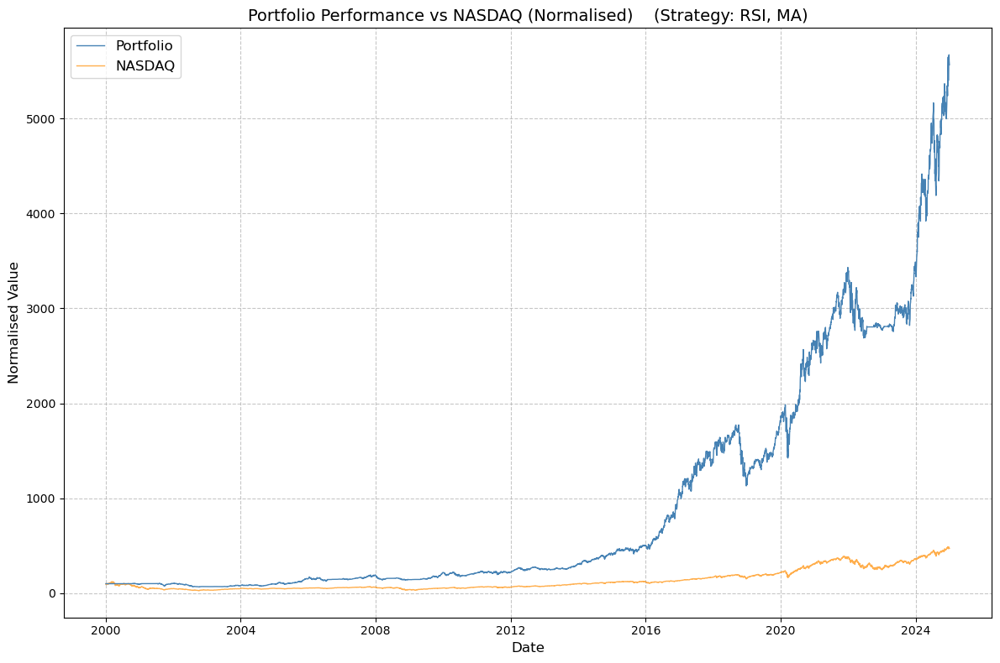

In [5]:
backtester.portfolio_vs_nasdaq_plot()

<a id="6"></a>
### 5. Plot of Stock Price with Trading Signals

In [6]:
backtester.trading_signals_plot()

c:\Users\Chern Teh\anaconda3\Lib\site-packages\kaleido\_sync_server.py:11: UserWarning:




This means that static image generation (e.g. `fig.write_image()`) will not work.

Please upgrade Plotly to version 6.1.1 or greater, or downgrade Kaleido to version 0.2.1.




Still image of Plot of Stock Price with Trading Signals can be viewed at: https://github.com/chernteh/Backtesting-System/blob/main/trading_signals_plot.png  
Interactive Plot of Stock Price with Trading Signals can be viewed at: https://github.com/chernteh/Backtesting-System/blob/main/trading_signals_plot%20(interactive).html